In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 

pd.set_option('display.precision', 2)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.options.display.float_format = '{:20,.0f}'.format

In [4]:
#reading the companies dataset into a pandas dataframe object
companies = pd.read_csv('companies.csv', encoding = "palmos")

companies['permalink'] = companies['permalink'].str.lower()

companies.head(100)

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at
0,/organization/-fame,#fame,http://livfame.com,Media,operating,IND,16,Mumbai,Mumbai,NaN
1,/organization/-qounter,:Qounter,http://www.qounter.com,Application Platforms|Real Time|Social Network Media,operating,USA,DE,DE - Other,Delaware City,04-09-2014
2,/organization/-the-one-of-them-inc-,"(THE) ONE of THEM,Inc.",http://oneofthem.jp,Apps|Games|Mobile,operating,NaN,NaN,NaN,NaN,NaN
3,/organization/0-6-com,0-6.com,http://www.0-6.com,Curated Web,operating,CHN,22,Beijing,Beijing,01-01-2007
4,/organization/004-technologies,004 Technologies,http://004gmbh.de/en/004-interact,Software,operating,USA,IL,"Springfield, Illinois",Champaign,01-01-2010
5,/organization/01games-technology,01Games Technology,http://www.01games.hk/,Games,operating,HKG,NaN,Hong Kong,Hong Kong,NaN
6,/organization/0ndine-biomedical-inc,Ondine Biomedical Inc.,http://ondinebio.com,Biotechnology,operating,CAN,BC,Vancouver,Vancouver,01-01-1997
7,/organization/0xdata,H2O.ai,http://h2o.ai/,Analytics,operating,USA,CA,SF Bay Area,Mountain View,01-01-2011
8,/organization/1,One Inc.,http://whatis1.com,Mobile,operating,USA,CA,SF Bay Area,San Francisco,01-08-2011
9,/organization/1-2-3-listo,"1,2,3 Listo",http://www.123listo.com,E-Commerce,operating,CHL,12,Santiago,Las Condes,01-01-2012


In [5]:
#reading the round2 dataset into a pandas dataframe object
round2 = pd.read_csv('rounds2.csv', encoding = 'palmos')

round2['company_permalink'] = round2['company_permalink'].str.lower()


round2.head(100)

,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd
0,/organization/-fame,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,05-01-2015,"10,000,000"
1,/organization/-qounter,/funding-round/22dacff496eb7acb2b901dec1dfe5633,venture,A,14-10-2014,nan
2,/organization/-qounter,/funding-round/b44fbb94153f6cdef13083530bb48030,seed,NaN,01-03-2014,"700,000"
3,/organization/-the-one-of-them-inc-,/funding-round/650b8f704416801069bb178a1418776b,venture,B,30-01-2014,"3,406,878"
4,/organization/0-6-com,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,A,19-03-2008,"2,000,000"
5,/organization/004-technologies,/funding-round/1278dd4e6a37fa4b7d7e06c21b3c1830,venture,NaN,24-07-2014,nan
6,/organization/01games-technology,/funding-round/7d53696f2b4f607a2f2a8cbb83d01839,undisclosed,NaN,01-07-2014,"41,250"
7,/organization/0ndine-biomedical-inc,/funding-round/2b9d3ac293d5cdccbecff5c8cb0f327d,seed,NaN,11-09-2009,"43,360"
8,/organization/0ndine-biomedical-inc,/funding-round/954b9499724b946ad8c396a57a5f3b72,venture,NaN,21-12-2009,"719,491"
9,/organization/0xdata,/funding-round/383a9bd2c04f7038bb543ccef5ba3eae,seed,NaN,22-05-2013,"3,000,000"


In [3]:
#calculating the number of unique identifiers for companies in the round2 dateset
len(round2.company_permalink.value_counts())

66368

In [4]:
#calculating the number of unique identifiers for companies in the companies dateset
len(companies.permalink.value_counts())

66368

In [6]:
companies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 66368 entries, 0 to 66367
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   permalink      66368 non-null  object
 1   name           66367 non-null  object
 2   homepage_url   61310 non-null  object
 3   category_list  63220 non-null  object
 4   status         66368 non-null  object
 5   country_code   59410 non-null  object
 6   state_code     57821 non-null  object
 7   region         58338 non-null  object
 8   city           58340 non-null  object
 9   founded_at     51147 non-null  object
dtypes: object(10)
memory usage: 5.1+ MB


In [68]:
#Checking the number of null values in the companies dataset
null_values_per_row_com = companies.isnull().sum(axis = 1).sort_values(ascending = False) 
null_values_per_row_com.head(300)


23033    7
42312    7
12670    7
45980    7
57998    7
65709    7
1617     7
29439    7
58015    7
4479     7
55662    7
4440     7
50185    7
4437     7
9551     7
16752    7
25743    7
50198    7
25751    7
4408     7
4395     7
9446     7
62490    7
20385    7
32172    7
33144    7
44415    7
25510    7
29554    7
29546    7
44431    7
25529    7
4605     7
20359    7
9380     7
25559    7
34297    7
12718    7
16615    7
16616    7
48701    7
55735    7
4571     7
16632    7
52055    7
55636    7
16827    7
32238    7
45860    7
4156     7
42115    7
61282    7
47166    7
32346    7
40927    7
29102    7
32360    7
29096    7
29091    7
19710    7
65582    7
9896     7
49298    7
19696    7
9921     7
62268    7
26204    7
19795    7
64550    7
29157    7
1776     7
12585    7
29296    7
4320     7
59452    7
25863    7
19955    7
25902    7
45880    7
55558    7
42132    7
29224    7
65626    7
9731     7
1795     7
62347    7
9785     7
61276    7
37031    7
4661     7
44387    7

In [69]:
#Checking the number of null values in the companies dataset
round2.isnull().sum(axis = 1).sort_values(ascending = False)



79376     2
78566     2
101356    2
78569     2
15801     2
101359    2
15800     2
101361    2
50324     2
15798     2
101364    2
15797     2
15796     2
29254     2
15793     2
50328     2
15790     2
50320     2
101351    2
41122     2
101350    2
101332    2
29236     2
15825     2
41120     2
15822     2
89308     2
15816     2
41116     2
101342    2
15813     2
41115     2
101346    2
78565     2
29246     2
50313     2
50329     2
89295     2
50334     2
50336     2
70286     2
70285     2
70283     2
15764     2
101402    2
70281     2
70280     2
15761     2
15760     2
50355     2
70277     2
29269     2
89281     2
101416    2
78581     2
101395    2
101394    2
41108     2
101383    2
15785     2
101378    2
101379    2
15782     2
101381    2
101382    2
101384    2
89292     2
101385    2
101386    2
15781     2
50338     2
89294     2
29256     2
29234     2
15830     2
70378     2
70358     2
15893     2
15892     2
101266    2
15891     2
15890     2
15889     2
5025

In [10]:
round2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114949 entries, 0 to 114948
Data columns (total 6 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   company_permalink        114949 non-null  object 
 1   funding_round_permalink  114949 non-null  object 
 2   funding_round_type       114949 non-null  object 
 3   funding_round_code       31140 non-null   object 
 4   funded_at                114949 non-null  object 
 5   raised_amount_usd        94959 non-null   float64
dtypes: float64(1), object(5)
memory usage: 5.3+ MB


In [137]:
round2_gb = round2.groupby('funding_round_type')['raised_amount_usd'].median()

round(round2_gb, 0) 

round2_gb.sort_values(ascending = False)

funding_round_type
secondary_market                  32,600,000
private_equity                    20,000,000
post_ipo_debt                     19,950,000
post_ipo_equity                   12,262,852
venture                            5,000,000
debt_financing                     1,100,000
undisclosed                        1,018,680
angel                                400,000
seed                                 275,000
convertible_note                     272,000
grant                                201,684
product_crowdfunding                 183,915
equity_crowdfunding                  100,000
non_equity_assistance                 60,000
Name: raised_amount_usd, dtype: float64

In [12]:
#verifying whether all the companies present in companies are in round 2 dataset

companies['permalink'].isin(round2['company_permalink']).sum()

66368

In [8]:
master_frame = companies.merge(round2, how = 'inner', left_on = 'permalink', right_on = 'company_permalink')

master_frame.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 114949 entries, 0 to 114948
Data columns (total 16 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   permalink                114949 non-null  object 
 1   name                     114948 non-null  object 
 2   homepage_url             108815 non-null  object 
 3   category_list            111539 non-null  object 
 4   status                   114949 non-null  object 
 5   country_code             106271 non-null  object 
 6   state_code               104003 non-null  object 
 7   region                   104782 non-null  object 
 8   city                     104785 non-null  object 
 9   founded_at               94428 non-null   object 
 10  company_permalink        114949 non-null  object 
 11  funding_round_permalink  114949 non-null  object 
 12  funding_round_type       114949 non-null  object 
 13  funding_round_code       31140 non-null   object 
 14  fund

In [9]:
master_frame.isnull().sum(axis = 0).sort_values(ascending = False)

funding_round_code         83809
founded_at                 20521
raised_amount_usd          19990
state_code                 10946
region                     10167
city                       10164
country_code                8678
homepage_url                6134
category_list               3410
name                           1
funded_at                      0
funding_round_type             0
funding_round_permalink        0
company_permalink              0
status                         0
permalink                      0
dtype: int64

In [10]:
#Dropping Null values from the raised_amount_usd column
master_frame.dropna(subset = ['raised_amount_usd'], inplace = True)

master_frame.isnull().sum(axis = 0).sort_values(ascending = False)


funding_round_code         66790
founded_at                 15966
state_code                  7604
region                      7048
city                        7045
country_code                5851
homepage_url                4332
category_list               1044
name                           1
raised_amount_usd              0
funded_at                      0
funding_round_type             0
funding_round_permalink        0
company_permalink              0
status                         0
permalink                      0
dtype: int64

In [12]:
master_frame.info()




<class 'pandas.core.frame.DataFrame'>
Int64Index: 94959 entries, 0 to 114948
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   permalink                94959 non-null  object 
 1   name                     94958 non-null  object 
 2   homepage_url             90627 non-null  object 
 3   category_list            93915 non-null  object 
 4   status                   94959 non-null  object 
 5   country_code             89108 non-null  object 
 6   state_code               87355 non-null  object 
 7   region                   87911 non-null  object 
 8   city                     87914 non-null  object 
 9   founded_at               78993 non-null  object 
 10  company_permalink        94959 non-null  object 
 11  funding_round_permalink  94959 non-null  object 
 12  funding_round_type       94959 non-null  object 
 13  funding_round_code       28169 non-null  object 
 14  funded_at            

In [13]:
#calculating the average value of amount raised for each funding round type, across all countries
master_frame_gb_mean = round(master_frame.groupby('funding_round_type')['raised_amount_usd'].mean().sort_values(ascending = False), 0)

master_frame_gb_mean = master_frame_gb_mean.astype('int')
master_frame_gb_mean

funding_round_type
post_ipo_debt            168704572
post_ipo_equity           82182494
secondary_market          79649630
private_equity            73308593
undisclosed               19242370
debt_financing            17043526
venture                   11748949
grant                      4300576
convertible_note           1453439
product_crowdfunding       1363131
angel                       958694
seed                        719818
equity_crowdfunding         538368
non_equity_assistance       411203
Name: raised_amount_usd, dtype: int32

In [14]:
#calculating the median amount of funding raised for each funding round type across all countries
master_frame_gb_median = round(master_frame.groupby('funding_round_type')['raised_amount_usd'].median().sort_values(ascending = False), 0)

master_frame_gb_median = master_frame_gb_median.astype('int')
master_frame_gb_median


funding_round_type
secondary_market         32600000
private_equity           20000000
post_ipo_debt            19950000
post_ipo_equity          12262852
venture                   5000000
debt_financing            1100000
undisclosed               1018680
angel                      400000
seed                       275000
convertible_note           272000
grant                      201684
product_crowdfunding       183915
equity_crowdfunding        100000
non_equity_assistance       60000
Name: raised_amount_usd, dtype: int32

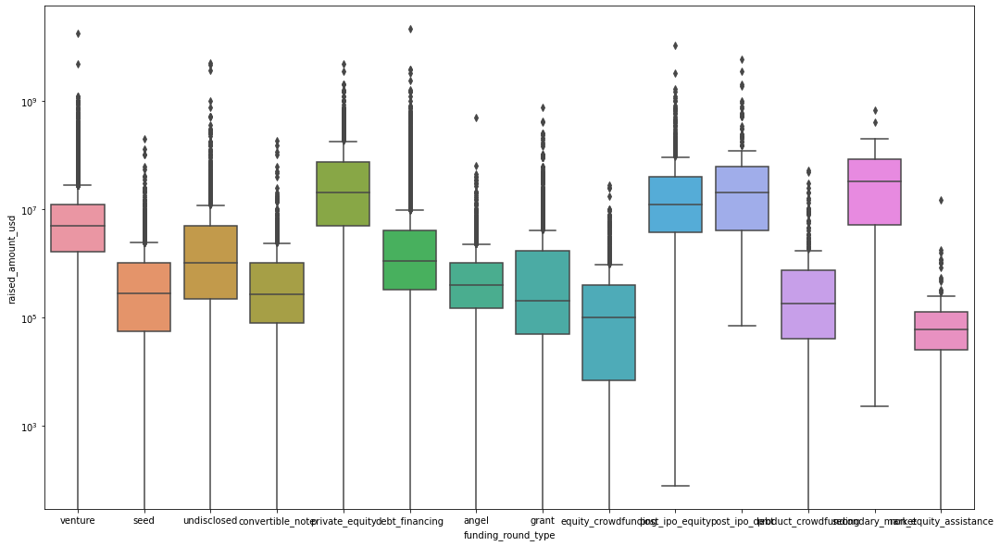

In [192]:
plt.figure(figsize = [18,10])
sns.boxplot(y = master_frame['raised_amount_usd'], x = master_frame['funding_round_type'])
plt.yscale('log')
plt.show()

Based on the plot of the types of funding rounds vs amount raised in US Dollars, 
it is pretty evident that the most suitable type of funding is venture since the 
median of venture exactly lies at 5 milllion dollars and the average value lies at 11 milllion dollars. 



In [15]:
#selecting the rows where the type of funding is venture
master_frame_ven = master_frame[master_frame['funding_round_type'] == 'venture'] 

master_frame_ven.head()


,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd
0,/organization/-fame,#fame,http://livfame.com,Media,operating,IND,16,Mumbai,Mumbai,NaN,/organization/-fame,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,05-01-2015,"10,000,000"
3,/organization/-the-one-of-them-inc-,"(THE) ONE of THEM,Inc.",http://oneofthem.jp,Apps|Games|Mobile,operating,NaN,NaN,NaN,NaN,NaN,/organization/-the-one-of-them-inc-,/funding-round/650b8f704416801069bb178a1418776b,venture,B,30-01-2014,"3,406,878"
4,/organization/0-6-com,0-6.com,http://www.0-6.com,Curated Web,operating,CHN,22,Beijing,Beijing,01-01-2007,/organization/0-6-com,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,A,19-03-2008,"2,000,000"
8,/organization/0ndine-biomedical-inc,Ondine Biomedical Inc.,http://ondinebio.com,Biotechnology,operating,CAN,BC,Vancouver,Vancouver,01-01-1997,/organization/0ndine-biomedical-inc,/funding-round/954b9499724b946ad8c396a57a5f3b72,venture,NaN,21-12-2009,"719,491"
10,/organization/0xdata,H2O.ai,http://h2o.ai/,Analytics,operating,USA,CA,SF Bay Area,Mountain View,01-01-2011,/organization/0xdata,/funding-round/3bb2ee4a2d89251a10aaa735b1180e44,venture,B,09-11-2015,"20,000,000"


In [16]:
#calculating the total amount of funding raised by each country for the funding round type venture
df_gb_countries = master_frame_ven.groupby('country_code')['raised_amount_usd'].sum()

df_gb_countries = round(df_gb_countries.sort_values(ascending = False), 0)

df_gb_countries.sort_values(ascending = False) 

country_code
USA        422,510,842,796
CHN         39,835,418,773
GBR         20,245,627,416
IND         14,391,858,718
CAN          9,583,332,317
FRA          7,259,536,732
ISR          6,907,514,579
DEU          6,346,959,822
JPN          3,363,676,611
SWE          3,254,952,563
NLD          2,939,403,619
CHE          2,827,560,264
SGP          2,793,917,856
ESP          1,835,831,452
BRA          1,785,986,890
IRL          1,676,131,350
RUS          1,570,426,005
AUS          1,322,934,948
DNK          1,228,310,641
BEL          1,070,542,301
FIN          1,043,199,709
NOR            956,192,413
KOR            939,988,262
MYS            883,058,787
HKG            781,266,982
AUT            630,954,952
TWN            623,979,485
TUR            559,097,457
ITA            488,289,353
NZL            448,316,383
LUX            363,100,678
ARE            342,617,539
ARG            314,338,819
BMU            288,800,000
IDN            288,492,285
EGY            268,225,000
NGA            

In [17]:
#Selecting only the top nine countries from the master_frame dataset
top_9 = df_gb_countries.sort_values(ascending = False)

top_9 = top_9[0:9]

top_9

country_code
USA        422,510,842,796
CHN         39,835,418,773
GBR         20,245,627,416
IND         14,391,858,718
CAN          9,583,332,317
FRA          7,259,536,732
ISR          6,907,514,579
DEU          6,346,959,822
JPN          3,363,676,611
Name: raised_amount_usd, dtype: float64

In [18]:
mapping = pd.read_csv('mapping.csv')

mapping

,category_list,Automotive & Sports,Blanks,Cleantech / Semiconductors,Entertainment,Health,Manufacturing,"News, Search and Messaging",Others,"Social, Finance, Analytics, Advertising"
0,NaN,0,1,0,0,0,0,0,0,0
1,3D,0,0,0,0,0,1,0,0,0
2,3D Printing,0,0,0,0,0,1,0,0,0
3,3D Technology,0,0,0,0,0,1,0,0,0
4,Accounting,0,0,0,0,0,0,0,0,1
5,Active Lifestyle,0,0,0,0,1,0,0,0,0
6,Ad Targeting,0,0,0,0,0,0,0,0,1
7,Advanced Materials,0,0,0,0,0,1,0,0,0
8,Adventure Travel,1,0,0,0,0,0,0,0,0
9,Advertising,0,0,0,0,0,0,0,0,1


In [19]:
#correcting the errors in the category names in the mapping dataset
mapping['category_list'] = mapping.category_list.str.replace('0', 'na')

mapping

,category_list,Automotive & Sports,Blanks,Cleantech / Semiconductors,Entertainment,Health,Manufacturing,"News, Search and Messaging",Others,"Social, Finance, Analytics, Advertising"
0,NaN,0,1,0,0,0,0,0,0,0
1,3D,0,0,0,0,0,1,0,0,0
2,3D Printing,0,0,0,0,0,1,0,0,0
3,3D Technology,0,0,0,0,0,1,0,0,0
4,Accounting,0,0,0,0,0,0,0,0,1
5,Active Lifestyle,0,0,0,0,1,0,0,0,0
6,Ad Targeting,0,0,0,0,0,0,0,0,1
7,Advanced Materials,0,0,0,0,0,1,0,0,0
8,Adventure Travel,1,0,0,0,0,0,0,0,0
9,Advertising,0,0,0,0,0,0,0,0,1


In [20]:
#Changing the format of the mapping dataset to make it easier to read and merge with the master_frame
mapping_melt = pd.melt(mapping, id_vars = ['category_list'], value_vars = ['Automotive & Sports', 'Blanks', 'Cleantech / Semiconductors', 'Entertainment', 'Health', 
                                                           'Manufacturing', 'News, Search and Messaging', 'Others', 'Social, Finance, Analytics, Advertising'], var_name = 'main_category')

#Removing the values which has 0 to remove unnecessary rows in the dataset
mapping_melt = mapping_melt[~(mapping_melt['value'] == 0)]


mapping_melt.rename(columns = {'category_list': 'primary_sector'}, inplace = True)


mapping_melt.reset_index(inplace = True)

mapping_melt.drop(columns = ['index'], inplace = True)


mapping_melt.drop(columns = 'value', inplace = True)

In [21]:
mapping_melt.rename(columns = {'main_category': 'main_sector'}, inplace = True)

mapping_melt

,primary_sector,main_sector
0,Adventure Travel,Automotive & Sports
1,Aerospace,Automotive & Sports
2,Auto,Automotive & Sports
3,Automated Kiosk,Automotive & Sports
4,Automotive,Automotive & Sports
5,Bicycles,Automotive & Sports
6,Boating Industry,Automotive & Sports
7,CAD,Automotive & Sports
8,Cars,Automotive & Sports
9,Design,Automotive & Sports


In [23]:
#creating a seperate column with the primary sector of each company
master_frame_ven['primary_sector'] = master_frame_ven['category_list'].str.split(pat = '|').str.get(0)



master_frame_ven.head(25)


C:\Users\sachi\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector
0,/organization/-fame,#fame,http://livfame.com,Media,operating,IND,16,Mumbai,Mumbai,NaN,/organization/-fame,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,05-01-2015,"10,000,000",Media
3,/organization/-the-one-of-them-inc-,"(THE) ONE of THEM,Inc.",http://oneofthem.jp,Apps|Games|Mobile,operating,NaN,NaN,NaN,NaN,NaN,/organization/-the-one-of-them-inc-,/funding-round/650b8f704416801069bb178a1418776b,venture,B,30-01-2014,"3,406,878",Apps
4,/organization/0-6-com,0-6.com,http://www.0-6.com,Curated Web,operating,CHN,22,Beijing,Beijing,01-01-2007,/organization/0-6-com,/funding-round/5727accaeaa57461bd22a9bdd945382d,venture,A,19-03-2008,"2,000,000",Curated Web
8,/organization/0ndine-biomedical-inc,Ondine Biomedical Inc.,http://ondinebio.com,Biotechnology,operating,CAN,BC,Vancouver,Vancouver,01-01-1997,/organization/0ndine-biomedical-inc,/funding-round/954b9499724b946ad8c396a57a5f3b72,venture,NaN,21-12-2009,"719,491",Biotechnology
10,/organization/0xdata,H2O.ai,http://h2o.ai/,Analytics,operating,USA,CA,SF Bay Area,Mountain View,01-01-2011,/organization/0xdata,/funding-round/3bb2ee4a2d89251a10aaa735b1180e44,venture,B,09-11-2015,"20,000,000",Analytics
11,/organization/0xdata,H2O.ai,http://h2o.ai/,Analytics,operating,USA,CA,SF Bay Area,Mountain View,01-01-2011,/organization/0xdata,/funding-round/ae2a174c06517c2394aed45006322a7e,venture,NaN,03-01-2013,"1,700,000",Analytics
12,/organization/0xdata,H2O.ai,http://h2o.ai/,Analytics,operating,USA,CA,SF Bay Area,Mountain View,01-01-2011,/organization/0xdata,/funding-round/e1cfcbe1bdf4c70277c5f29a3482f24e,venture,A,19-07-2014,"8,900,000",Analytics
22,/organization/1-mainstream,1 Mainstream,http://www.1mainstream.com,Apps|Cable|Distribution|Software,acquired,USA,CA,SF Bay Area,Cupertino,01-03-2012,/organization/1-mainstream,/funding-round/b952cbaf401f310927430c97b68162ea,venture,NaN,17-03-2015,"5,000,000",Apps
28,/organization/10-minutes-with,10 Minutes With,http://10minuteswith.com,Education,operating,GBR,H9,London,London,01-01-2013,/organization/10-minutes-with,/funding-round/0faccbbcc5818dc5326469f13f5a8ac8,venture,A,09-10-2014,"4,000,000",Education
34,/organization/1000memories,1000memories,http://1000memories.com,Curated Web,acquired,USA,CA,SF Bay Area,San Francisco,01-07-2010,/organization/1000memories,/funding-round/502bd0e50c27616995e4bdad24605ef8,venture,A,16-02-2011,"2,520,000",Curated Web


In [25]:
master_frame_map = pd.merge(master_frame_ven, mapping_melt, how = 'inner', on = 'primary_sector')

master_frame_map.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector
0,/organization/-fame,#fame,http://livfame.com,Media,operating,IND,16,Mumbai,Mumbai,NaN,/organization/-fame,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,05-01-2015,"10,000,000",Media,Entertainment
1,/organization/90min,90min,http://www.90min.com,Media|News|Publishing|Soccer|Sports,operating,GBR,H9,London,London,01-01-2011,/organization/90min,/funding-round/21a2cbf6f2fb2a1c2a61e04bf930dfe6,venture,NaN,06-10-2015,"15,000,000",Media,Entertainment
2,/organization/90min,90min,http://www.90min.com,Media|News|Publishing|Soccer|Sports,operating,GBR,H9,London,London,01-01-2011,/organization/90min,/funding-round/bd626ed022f5c66574b1afe234f3c90d,venture,NaN,07-05-2013,"5,800,000",Media,Entertainment
3,/organization/90min,90min,http://www.90min.com,Media|News|Publishing|Soccer|Sports,operating,GBR,H9,London,London,01-01-2011,/organization/90min,/funding-round/fd4b15e8c97ee2ffc0acccdbe1a98810,venture,NaN,26-03-2014,"18,000,000",Media,Entertainment
4,/organization/all-def-digital,All Def Digital,http://alldefdigital.com,Media,operating,USA,CA,Los Angeles,Los Angeles,NaN,/organization/all-def-digital,/funding-round/452a2342fe720285c3b92e9bd927d9ba,venture,A,06-08-2014,"5,000,000",Media,Entertainment


In [26]:
#Creating 3 separate datasets for the top 3 English speaking countries
D1 = master_frame_map[(master_frame_map['country_code'] == 'USA') & (master_frame_map['raised_amount_usd'] >= 5000000) & (master_frame_map['raised_amount_usd'] <= 15000000)]
D2 = master_frame_map[(master_frame_map['country_code'] == 'GBR') & (master_frame_map['raised_amount_usd'] >= 5000000) & (master_frame_map['raised_amount_usd'] <= 15000000)]
D3 = master_frame_map[(master_frame_map['country_code'] == 'IND') & (master_frame_map['raised_amount_usd'] >= 5000000) & (master_frame_map['raised_amount_usd'] <= 15000000)]

D1.head(20)

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector
4,/organization/all-def-digital,All Def Digital,http://alldefdigital.com,Media,operating,USA,CA,Los Angeles,Los Angeles,NaN,/organization/all-def-digital,/funding-round/452a2342fe720285c3b92e9bd927d9ba,venture,A,06-08-2014,"5,000,000",Media,Entertainment
16,/organization/chefs-feed,ChefsFeed,http://www.chefsfeed.com,Media|Mobile|Restaurants|Technology,operating,USA,CA,SF Bay Area,San Francisco,01-01-2012,/organization/chefs-feed,/funding-round/adca195749ae9ace84684723fbe75e5b,venture,A,26-02-2015,"5,000,000",Media,Entertainment
24,/organization/huffingtonpost,The Huffington Post,http://www.huffingtonpost.com,Media|News|Publishing,acquired,USA,NY,New York City,New York,09-05-2005,/organization/huffingtonpost,/funding-round/7f05940c4d2dfecb8e50a0e5720e5065,venture,A,01-08-2006,"5,000,000",Media,Entertainment
25,/organization/huffingtonpost,The Huffington Post,http://www.huffingtonpost.com,Media|News|Publishing,acquired,USA,NY,New York City,New York,09-05-2005,/organization/huffingtonpost,/funding-round/9241ae16e08df17ebdc064e49e23035a,venture,B,01-09-2007,"5,000,000",Media,Entertainment
33,/organization/matchmine,MatchMine,http://matchmine.com,Media|News|Reviews and Recommendations,closed,USA,MA,Boston,Needham,01-01-2007,/organization/matchmine,/funding-round/41ac526630da57ad6eb9d02431b17657,venture,A,01-09-2007,"10,000,000",Media,Entertainment
35,/organization/mediabong,MEDIABONG,http://www.mediabong.com,Media|Semantic Search|Video,operating,USA,NY,New York City,New York,30-05-2011,/organization/mediabong,/funding-round/9282890ca87072025dc1807f400acee6,venture,B,13-05-2015,"5,000,000",Media,Entertainment
38,/organization/newscorporation,News Corp,http://www.newscorp.com,Media|News|Publishing,ipo,USA,NY,New York City,New York,01-01-2013,/organization/newscorporation,/funding-round/8f6d7c4592e43e91e8688ba342bffcb7,venture,NaN,08-01-2010,"12,500,000",Media,Entertainment
39,/organization/nokeena,Ankeena Networks,http://www.ankeena.com,Media|Software,acquired,USA,CA,SF Bay Area,Santa Clara,01-01-2008,/organization/nokeena,/funding-round/9225f2db6b1b74892d5de6a8744b94ea,venture,A,08-08-2008,"9,400,000",Media,Entertainment
41,/organization/nokeena,Ankeena Networks,http://www.ankeena.com,Media|Software,acquired,USA,CA,SF Bay Area,Santa Clara,01-01-2008,/organization/nokeena,/funding-round/fb7a617ed6d1a3203024f0f111417bfb,venture,B,25-06-2009,"6,500,000",Media,Entertainment
45,/organization/plumtv,PlumTV,http://www.plumtv.com,Media|Television|Web Hosting,closed,USA,NY,New York City,New York,01-01-2002,/organization/plumtv,/funding-round/e5109c28c1b4899b068cfa552850c424,venture,B,01-09-2009,"5,200,000",Media,Entertainment


In [27]:
D1.info()
D1.isnull().sum()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12098 entries, 4 to 50026
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   permalink                12098 non-null  object 
 1   name                     12098 non-null  object 
 2   homepage_url             11509 non-null  object 
 3   category_list            12012 non-null  object 
 4   status                   12098 non-null  object 
 5   country_code             12098 non-null  object 
 6   state_code               12096 non-null  object 
 7   region                   12089 non-null  object 
 8   city                     12089 non-null  object 
 9   founded_at               10377 non-null  object 
 10  company_permalink        12098 non-null  object 
 11  funding_round_permalink  12098 non-null  object 
 12  funding_round_type       12098 non-null  object 
 13  funding_round_code       8637 non-null   object 
 14  funded_at             

permalink                     0
name                          0
homepage_url                589
category_list                86
status                        0
country_code                  0
state_code                    2
region                        9
city                          9
founded_at                 1721
company_permalink             0
funding_round_permalink       0
funding_round_type            0
funding_round_code         3461
funded_at                     0
raised_amount_usd             0
primary_sector               86
main_sector                   0
dtype: int64

In [30]:
#calculating the number of investments made in each main sector and merging it
investment_count_D1 =  D1.groupby('main_sector')['raised_amount_usd'].count()

investment_count_D1

main_sector
Automotive & Sports                         167
Blanks                                       86
Cleantech / Semiconductors                 2300
Entertainment                               591
Health                                      909
Manufacturing                               799
News, Search and Messaging                 1582
Others                                     2950
Social, Finance, Analytics, Advertising    2714
Name: raised_amount_usd, dtype: int64

In [31]:
D1 = D1.merge(investment_count_D1, how='inner', on = 'main_sector')

D1.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd_x,primary_sector,main_sector,raised_amount_usd_y
0,/organization/all-def-digital,All Def Digital,http://alldefdigital.com,Media,operating,USA,CA,Los Angeles,Los Angeles,NaN,/organization/all-def-digital,/funding-round/452a2342fe720285c3b92e9bd927d9ba,venture,A,06-08-2014,"5,000,000",Media,Entertainment,591
1,/organization/chefs-feed,ChefsFeed,http://www.chefsfeed.com,Media|Mobile|Restaurants|Technology,operating,USA,CA,SF Bay Area,San Francisco,01-01-2012,/organization/chefs-feed,/funding-round/adca195749ae9ace84684723fbe75e5b,venture,A,26-02-2015,"5,000,000",Media,Entertainment,591
2,/organization/huffingtonpost,The Huffington Post,http://www.huffingtonpost.com,Media|News|Publishing,acquired,USA,NY,New York City,New York,09-05-2005,/organization/huffingtonpost,/funding-round/7f05940c4d2dfecb8e50a0e5720e5065,venture,A,01-08-2006,"5,000,000",Media,Entertainment,591
3,/organization/huffingtonpost,The Huffington Post,http://www.huffingtonpost.com,Media|News|Publishing,acquired,USA,NY,New York City,New York,09-05-2005,/organization/huffingtonpost,/funding-round/9241ae16e08df17ebdc064e49e23035a,venture,B,01-09-2007,"5,000,000",Media,Entertainment,591
4,/organization/matchmine,MatchMine,http://matchmine.com,Media|News|Reviews and Recommendations,closed,USA,MA,Boston,Needham,01-01-2007,/organization/matchmine,/funding-round/41ac526630da57ad6eb9d02431b17657,venture,A,01-09-2007,"10,000,000",Media,Entertainment,591


In [32]:
#Renaming the newly merged column to make it easier to understand
D1.rename(columns = {'raised_amount_usd_y' : 'count_of_investments_per_sector', 'raised_amount_usd_x': 'raised_amount_usd'}, inplace = True)

D1.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector,count_of_investments_per_sector
0,/organization/all-def-digital,All Def Digital,http://alldefdigital.com,Media,operating,USA,CA,Los Angeles,Los Angeles,NaN,/organization/all-def-digital,/funding-round/452a2342fe720285c3b92e9bd927d9ba,venture,A,06-08-2014,"5,000,000",Media,Entertainment,591
1,/organization/chefs-feed,ChefsFeed,http://www.chefsfeed.com,Media|Mobile|Restaurants|Technology,operating,USA,CA,SF Bay Area,San Francisco,01-01-2012,/organization/chefs-feed,/funding-round/adca195749ae9ace84684723fbe75e5b,venture,A,26-02-2015,"5,000,000",Media,Entertainment,591
2,/organization/huffingtonpost,The Huffington Post,http://www.huffingtonpost.com,Media|News|Publishing,acquired,USA,NY,New York City,New York,09-05-2005,/organization/huffingtonpost,/funding-round/7f05940c4d2dfecb8e50a0e5720e5065,venture,A,01-08-2006,"5,000,000",Media,Entertainment,591
3,/organization/huffingtonpost,The Huffington Post,http://www.huffingtonpost.com,Media|News|Publishing,acquired,USA,NY,New York City,New York,09-05-2005,/organization/huffingtonpost,/funding-round/9241ae16e08df17ebdc064e49e23035a,venture,B,01-09-2007,"5,000,000",Media,Entertainment,591
4,/organization/matchmine,MatchMine,http://matchmine.com,Media|News|Reviews and Recommendations,closed,USA,MA,Boston,Needham,01-01-2007,/organization/matchmine,/funding-round/41ac526630da57ad6eb9d02431b17657,venture,A,01-09-2007,"10,000,000",Media,Entertainment,591


In [33]:
#Calculating the amount invested in each main sector
investment_amount_D1 =  D1.groupby('main_sector')['raised_amount_usd'].sum()

D1.groupby('main_sector')['raised_amount_usd'].sum()

main_sector
Automotive & Sports                              1,454,104,361
Blanks                                             764,763,292
Cleantech / Semiconductors                      21,206,628,192
Entertainment                                    5,099,197,982
Health                                           8,211,859,357
Manufacturing                                    7,258,553,378
News, Search and Messaging                      13,959,567,428
Others                                          26,321,007,002
Social, Finance, Analytics, Advertising         23,807,376,964
Name: raised_amount_usd, dtype: float64

In [34]:
D1 = D1.merge(investment_amount_D1, how='inner', on = 'main_sector')

D1.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd_x,primary_sector,main_sector,count_of_investments_per_sector,raised_amount_usd_y
0,/organization/all-def-digital,All Def Digital,http://alldefdigital.com,Media,operating,USA,CA,Los Angeles,Los Angeles,NaN,/organization/all-def-digital,/funding-round/452a2342fe720285c3b92e9bd927d9ba,venture,A,06-08-2014,"5,000,000",Media,Entertainment,591,"5,099,197,982"
1,/organization/chefs-feed,ChefsFeed,http://www.chefsfeed.com,Media|Mobile|Restaurants|Technology,operating,USA,CA,SF Bay Area,San Francisco,01-01-2012,/organization/chefs-feed,/funding-round/adca195749ae9ace84684723fbe75e5b,venture,A,26-02-2015,"5,000,000",Media,Entertainment,591,"5,099,197,982"
2,/organization/huffingtonpost,The Huffington Post,http://www.huffingtonpost.com,Media|News|Publishing,acquired,USA,NY,New York City,New York,09-05-2005,/organization/huffingtonpost,/funding-round/7f05940c4d2dfecb8e50a0e5720e5065,venture,A,01-08-2006,"5,000,000",Media,Entertainment,591,"5,099,197,982"
3,/organization/huffingtonpost,The Huffington Post,http://www.huffingtonpost.com,Media|News|Publishing,acquired,USA,NY,New York City,New York,09-05-2005,/organization/huffingtonpost,/funding-round/9241ae16e08df17ebdc064e49e23035a,venture,B,01-09-2007,"5,000,000",Media,Entertainment,591,"5,099,197,982"
4,/organization/matchmine,MatchMine,http://matchmine.com,Media|News|Reviews and Recommendations,closed,USA,MA,Boston,Needham,01-01-2007,/organization/matchmine,/funding-round/41ac526630da57ad6eb9d02431b17657,venture,A,01-09-2007,"10,000,000",Media,Entertainment,591,"5,099,197,982"


In [35]:
#renaming the newly merged columns to make it easier to read
D1.rename(columns = {'raised_amount_usd_y' : 'total_amount_raised_per_sector', 'raised_amount_usd_x': 'raised_amount_usd'}, inplace = True)

In [36]:
#performing sanity checks 
D1.tail(50)

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector,count_of_investments_per_sector,total_amount_raised_per_sector
12048,/organization/project-decor,Domino,http://domino.com,Design,operating,USA,CT,Hartford,Westport,01-01-2011,/organization/project-decor,/funding-round/f1708adc7f4612c5ca838a57d674739a,venture,B,20-05-2013,"5,000,000",Design,Automotive & Sports,167,"1,454,104,361"
12049,/organization/purcell-systems,Purcell Systems,NaN,Design|Electronics|Manufacturing|Service Providers|Telecommunications,acquired,USA,WA,Spokane,Spokane,NaN,/organization/purcell-systems,/funding-round/598ed58ca308f288d406fd8e8418bc1f,venture,NaN,10-07-2007,"15,000,000",Design,Automotive & Sports,167,"1,454,104,361"
12050,/organization/purcell-systems,Purcell Systems,NaN,Design|Electronics|Manufacturing|Service Providers|Telecommunications,acquired,USA,WA,Spokane,Spokane,NaN,/organization/purcell-systems,/funding-round/9e7f8c035b4f69e9b4a9803526c9c541,venture,B,04-05-2007,"10,000,000",Design,Automotive & Sports,167,"1,454,104,361"
12051,/organization/raidcore,RAIDCore,http://www.raidcore.com,Design|Enterprises|Storage,closed,USA,NH,"Manchester, New Hampshire",Nashua,01-01-2000,/organization/raidcore,/funding-round/42a1859741e8f5bf1b3f0cfffdbd95fb,venture,A,07-11-2003,"5,000,000",Design,Automotive & Sports,167,"1,454,104,361"
12052,/organization/rbn,RBN,http://www.rbni.com/,Design|Services|Transportation,closed,USA,CA,SF Bay Area,San Francisco,NaN,/organization/rbn,/funding-round/5a55649f6394df6f0fb2e7292278c26e,venture,NaN,21-04-2004,"9,500,000",Design,Automotive & Sports,167,"1,454,104,361"
12053,/organization/redfern-broadband-networks,Redfern Broadband Networks,http://www.rbni.com,Design,acquired,USA,CA,SF Bay Area,San Francisco,NaN,/organization/redfern-broadband-networks,/funding-round/50ec5cd67a8628654d082c8494b58a72,venture,C,28-01-2003,"11,000,000",Design,Automotive & Sports,167,"1,454,104,361"
12054,/organization/servergy,Servergy,http://servergy.com,Design,operating,USA,TX,Dallas,Mckinney,01-01-2009,/organization/servergy,/funding-round/879606dc51e3a085579e52bf31c47b11,venture,NaN,10-06-2012,"5,637,090",Design,Automotive & Sports,167,"1,454,104,361"
12055,/organization/sunrise-atelier,Sunrise Atelier,NaN,Design|Email|Services,operating,USA,NY,New York City,New York,01-01-2012,/organization/sunrise-atelier,/funding-round/01837064569ff00f1612210ea30e9b6c,venture,A,22-07-2014,"5,999,956",Design,Automotive & Sports,167,"1,454,104,361"
12056,/organization/teravicta-technologies,TeraVicta Technologies,NaN,Design|Distribution|Manufacturing,operating,USA,TX,Austin,Austin,01-01-2000,/organization/teravicta-technologies,/funding-round/3f45bbbd6726b5b6976697443e4c1b6c,venture,B,19-02-2004,"6,000,000",Design,Automotive & Sports,167,"1,454,104,361"
12057,/organization/teravicta-technologies,TeraVicta Technologies,NaN,Design|Distribution|Manufacturing,operating,USA,TX,Austin,Austin,01-01-2000,/organization/teravicta-technologies,/funding-round/3f6f4979cb47f60f3a69c9316f901071,venture,D,18-04-2005,"7,500,000",Design,Automotive & Sports,167,"1,454,104,361"


In [37]:
D2.info()


investment_count_D2 =  D2.groupby('main_sector')['raised_amount_usd'].count()

D2.groupby('main_sector')['raised_amount_usd'].count()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 626 entries, 1 to 50021
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   permalink                626 non-null    object 
 1   name                     626 non-null    object 
 2   homepage_url             595 non-null    object 
 3   category_list            619 non-null    object 
 4   status                   626 non-null    object 
 5   country_code             626 non-null    object 
 6   state_code               611 non-null    object 
 7   region                   596 non-null    object 
 8   city                     596 non-null    object 
 9   founded_at               500 non-null    object 
 10  company_permalink        626 non-null    object 
 11  funding_round_permalink  626 non-null    object 
 12  funding_round_type       626 non-null    object 
 13  funding_round_code       388 non-null    object 
 14  funded_at               

main_sector
Automotive & Sports                         16
Blanks                                       7
Cleantech / Semiconductors                 128
Entertainment                               56
Health                                      24
Manufacturing                               42
News, Search and Messaging                  73
Others                                     147
Social, Finance, Analytics, Advertising    133
Name: raised_amount_usd, dtype: int64

In [38]:
D2 = D2.merge(investment_count_D2, how='inner', on = 'main_sector')

D2.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd_x,primary_sector,main_sector,raised_amount_usd_y
0,/organization/90min,90min,http://www.90min.com,Media|News|Publishing|Soccer|Sports,operating,GBR,H9,London,London,01-01-2011,/organization/90min,/funding-round/21a2cbf6f2fb2a1c2a61e04bf930dfe6,venture,NaN,06-10-2015,"15,000,000",Media,Entertainment,56
1,/organization/90min,90min,http://www.90min.com,Media|News|Publishing|Soccer|Sports,operating,GBR,H9,London,London,01-01-2011,/organization/90min,/funding-round/bd626ed022f5c66574b1afe234f3c90d,venture,NaN,07-05-2013,"5,800,000",Media,Entertainment,56
2,/organization/eutechnyx,Eutechnyx,http://press.eutechnyx.com,Games,operating,GBR,E5,Gateshead,Gateshead,01-01-1987,/organization/eutechnyx,/funding-round/d2fc787fbc5e4f468dff8b2c557993f1,venture,A,13-05-2010,"8,800,000",Games,Entertainment,56
3,/organization/mind-candy,Mind Candy,http://www.mindcandy.com,Games,operating,GBR,H9,London,London,01-01-2003,/organization/mind-candy,/funding-round/47df01ed44d7b5916159051e5e32391e,venture,B,01-06-2011,"10,000,000",Games,Entertainment,56
4,/organization/mind-candy,Mind Candy,http://www.mindcandy.com,Games,operating,GBR,H9,London,London,01-01-2003,/organization/mind-candy,/funding-round/c6a873b4cbdd7ea3d023a771bd3b2f99,venture,A,23-11-2006,"10,860,000",Games,Entertainment,56


In [ ]:
investment_amount_D2 =  D2.groupby('main_sector')['raised_amount_usd_x'].sum()
D2 = D2.merge(investment_amount_D2, how='inner', on = 'main_sector')

In [42]:
D2.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd_x_x,primary_sector,main_sector,raised_amount_usd_y,raised_amount_usd_x_y
0,/organization/90min,90min,http://www.90min.com,Media|News|Publishing|Soccer|Sports,operating,GBR,H9,London,London,01-01-2011,/organization/90min,/funding-round/21a2cbf6f2fb2a1c2a61e04bf930dfe6,venture,NaN,06-10-2015,"15,000,000",Media,Entertainment,56,"482,784,687"
1,/organization/90min,90min,http://www.90min.com,Media|News|Publishing|Soccer|Sports,operating,GBR,H9,London,London,01-01-2011,/organization/90min,/funding-round/bd626ed022f5c66574b1afe234f3c90d,venture,NaN,07-05-2013,"5,800,000",Media,Entertainment,56,"482,784,687"
2,/organization/eutechnyx,Eutechnyx,http://press.eutechnyx.com,Games,operating,GBR,E5,Gateshead,Gateshead,01-01-1987,/organization/eutechnyx,/funding-round/d2fc787fbc5e4f468dff8b2c557993f1,venture,A,13-05-2010,"8,800,000",Games,Entertainment,56,"482,784,687"
3,/organization/mind-candy,Mind Candy,http://www.mindcandy.com,Games,operating,GBR,H9,London,London,01-01-2003,/organization/mind-candy,/funding-round/47df01ed44d7b5916159051e5e32391e,venture,B,01-06-2011,"10,000,000",Games,Entertainment,56,"482,784,687"
4,/organization/mind-candy,Mind Candy,http://www.mindcandy.com,Games,operating,GBR,H9,London,London,01-01-2003,/organization/mind-candy,/funding-round/c6a873b4cbdd7ea3d023a771bd3b2f99,venture,A,23-11-2006,"10,860,000",Games,Entertainment,56,"482,784,687"


In [43]:
D2.rename(columns = {'raised_amount_usd_y' : 'count_of_investments_per_sector', 'raised_amount_usd_x_y' : 'total_amount_raised_per_sector', 'raised_amount_usd_x_x': 'raised_amount_usd'}, inplace = True)


D2.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector,count_of_investments_per_sector,total_amount_raised_per_sector
0,/organization/90min,90min,http://www.90min.com,Media|News|Publishing|Soccer|Sports,operating,GBR,H9,London,London,01-01-2011,/organization/90min,/funding-round/21a2cbf6f2fb2a1c2a61e04bf930dfe6,venture,NaN,06-10-2015,"15,000,000",Media,Entertainment,56,"482,784,687"
1,/organization/90min,90min,http://www.90min.com,Media|News|Publishing|Soccer|Sports,operating,GBR,H9,London,London,01-01-2011,/organization/90min,/funding-round/bd626ed022f5c66574b1afe234f3c90d,venture,NaN,07-05-2013,"5,800,000",Media,Entertainment,56,"482,784,687"
2,/organization/eutechnyx,Eutechnyx,http://press.eutechnyx.com,Games,operating,GBR,E5,Gateshead,Gateshead,01-01-1987,/organization/eutechnyx,/funding-round/d2fc787fbc5e4f468dff8b2c557993f1,venture,A,13-05-2010,"8,800,000",Games,Entertainment,56,"482,784,687"
3,/organization/mind-candy,Mind Candy,http://www.mindcandy.com,Games,operating,GBR,H9,London,London,01-01-2003,/organization/mind-candy,/funding-round/47df01ed44d7b5916159051e5e32391e,venture,B,01-06-2011,"10,000,000",Games,Entertainment,56,"482,784,687"
4,/organization/mind-candy,Mind Candy,http://www.mindcandy.com,Games,operating,GBR,H9,London,London,01-01-2003,/organization/mind-candy,/funding-round/c6a873b4cbdd7ea3d023a771bd3b2f99,venture,A,23-11-2006,"10,860,000",Games,Entertainment,56,"482,784,687"


In [44]:


investment_count_D3 =  D3.groupby('main_sector')['raised_amount_usd'].count()
D3 = D3.merge(investment_count_D3, how='inner', on = 'main_sector')


investment_amount_D3 =  D3.groupby('main_sector')['raised_amount_usd_x'].sum()
D3 = D3.merge(investment_amount_D3, how='inner', on = 'main_sector')

D3.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd_x_x,primary_sector,main_sector,raised_amount_usd_y,raised_amount_usd_x_y
0,/organization/-fame,#fame,http://livfame.com,Media,operating,IND,16,Mumbai,Mumbai,NaN,/organization/-fame,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,05-01-2015,"10,000,000",Media,Entertainment,33,"280,830,000"
1,/organization/dhruva,Dhruva,http://www.dhruva.com/,Games,operating,IND,19,Bangalore,Bangalore,01-01-1997,/organization/dhruva,/funding-round/6035248811c9530b11bd442d9239a0b1,venture,NaN,27-11-2006,"5,000,000",Games,Entertainment,33,"280,830,000"
2,/organization/games2win,Games2Win,http://www.games2win.com,Games,operating,IND,16,Mumbai,Mumbai,01-01-2005,/organization/games2win,/funding-round/6b024f4906c288c66d1df966e6aeb256,venture,A,29-03-2007,"5,000,000",Games,Entertainment,33,"280,830,000"
3,/organization/games2win,Games2Win,http://www.games2win.com,Games,operating,IND,16,Mumbai,Mumbai,01-01-2005,/organization/games2win,/funding-round/b095563fd43d1e4fd16da3f4bcd040af,venture,B,30-03-2011,"6,000,000",Games,Entertainment,33,"280,830,000"
4,/organization/pokkt,POKKT,http://www.pokkt.com,Games,operating,IND,16,Mumbai,Mumbai,01-08-2012,/organization/pokkt,/funding-round/adb94c131e001a7438a4695d873d8dc1,venture,B,03-11-2015,"5,000,000",Games,Entertainment,33,"280,830,000"


In [45]:
D3.rename(columns = {'raised_amount_usd_y' : 'count_of_investments_per_sector', 'raised_amount_usd_x_y' : 'total_amount_raised_per_sector', 'raised_amount_usd_x_x': 'raised_amount_usd'}, inplace = True)

D3.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector,count_of_investments_per_sector,total_amount_raised_per_sector
0,/organization/-fame,#fame,http://livfame.com,Media,operating,IND,16,Mumbai,Mumbai,NaN,/organization/-fame,/funding-round/9a01d05418af9f794eebff7ace91f638,venture,B,05-01-2015,"10,000,000",Media,Entertainment,33,"280,830,000"
1,/organization/dhruva,Dhruva,http://www.dhruva.com/,Games,operating,IND,19,Bangalore,Bangalore,01-01-1997,/organization/dhruva,/funding-round/6035248811c9530b11bd442d9239a0b1,venture,NaN,27-11-2006,"5,000,000",Games,Entertainment,33,"280,830,000"
2,/organization/games2win,Games2Win,http://www.games2win.com,Games,operating,IND,16,Mumbai,Mumbai,01-01-2005,/organization/games2win,/funding-round/6b024f4906c288c66d1df966e6aeb256,venture,A,29-03-2007,"5,000,000",Games,Entertainment,33,"280,830,000"
3,/organization/games2win,Games2Win,http://www.games2win.com,Games,operating,IND,16,Mumbai,Mumbai,01-01-2005,/organization/games2win,/funding-round/b095563fd43d1e4fd16da3f4bcd040af,venture,B,30-03-2011,"6,000,000",Games,Entertainment,33,"280,830,000"
4,/organization/pokkt,POKKT,http://www.pokkt.com,Games,operating,IND,16,Mumbai,Mumbai,01-08-2012,/organization/pokkt,/funding-round/adb94c131e001a7438a4695d873d8dc1,venture,B,03-11-2015,"5,000,000",Games,Entertainment,33,"280,830,000"


In [46]:
#calculating the total number of investments made in the United Stated across all main sectors 
D1.count_of_investments_per_sector.value_counts().sum()

12098

In [51]:
#Calcluating the top 3 sectors in the United States and no. of investments made in each of them
D1.groupby('main_sector')['raised_amount_usd'].count()

main_sector
Automotive & Sports                         167
Blanks                                       86
Cleantech / Semiconductors                 2300
Entertainment                               591
Health                                      909
Manufacturing                               799
News, Search and Messaging                 1582
Others                                     2950
Social, Finance, Analytics, Advertising    2714
Name: raised_amount_usd, dtype: int64

In [52]:
#Calculating the total amount raised by all the sectors in USA
D1.total_amount_raised_per_sector.unique().sum()

108083057956.0

In [240]:
#Top companies that raised maximum amount in the Others sector in USA
D1.loc[D1['main_sector'] == 'Others'].sort_values(by = 'raised_amount_usd', ascending = False)

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector,total_amount_raised_per_sector,count_of_investments_per_sector
4959,/organization/foursquare,Foursquare,https://foursquare.com,Location Based Services|Mobile,operating,USA,NY,New York City,New York,01-03-2009,/organization/foursquare,/funding-round/6a11c556a4bd9f4120c5fc1f50069021,venture,D,04-02-2014,"15,000,000",Location Based Services,Others,"26,321,007,002",2950
2747,/organization/nantmobile,NantMobile,http://nantmobile.com/,Software,operating,USA,CA,Los Angeles,Culver City,01-01-2013,/organization/nantmobile,/funding-round/81624cc7e6a1d45f3f7ab4f517ada107,venture,NaN,01-02-2014,"15,000,000",Software,Others,"26,321,007,002",2950
3820,/organization/shoutlet,Shoutlet,http://www.shoutlet.com,Enterprise Software,acquired,USA,WI,Madison,Madison,01-01-2010,/organization/shoutlet,/funding-round/8c6d95539261b435c48536feabbbdd16,venture,C,07-06-2012,"15,000,000",Enterprise Software,Others,"26,321,007,002",2950
3828,/organization/slicex,sliceX,http://www.slicex.com,Enterprise Software,operating,USA,CA,SF Bay Area,San Jose,01-01-1996,/organization/slicex,/funding-round/51b831eaf0bf95770d3f93f63d03a530,venture,B,08-08-2008,"15,000,000",Enterprise Software,Others,"26,321,007,002",2950
2344,/organization/certeon,Certeon,http://www.certeon.com,Software,closed,USA,MA,Boston,Burlington,01-01-2003,/organization/certeon,/funding-round/02f7143dbddff83a622e58ad4f74643d,venture,B,16-07-2007,"15,000,000",Software,Others,"26,321,007,002",2950
4608,/organization/wichorus,WiChorus,http://www.wichorus.com,Web Hosting,acquired,USA,CA,SF Bay Area,San Jose,01-01-2005,/organization/wichorus,/funding-round/264488982f239aea119091061975adb8,venture,B,17-09-2007,"15,000,000",Web Hosting,Others,"26,321,007,002",2950
3833,/organization/smartvue,Smartvue,http://www.smartvue.com,Enterprise Software,operating,USA,TN,Nashville,Nashville,01-01-1996,/organization/smartvue,/funding-round/d6e79df2aba14b5b263da9f4e30de1d2,venture,B,28-04-2015,"15,000,000",Enterprise Software,Others,"26,321,007,002",2950
2712,/organization/mendocino-software,Mendocino Software,http://www.dciginc.com/2008/02/mendocino-software-reportedly.html,Software,closed,USA,CA,SF Bay Area,Fremont,01-01-2003,/organization/mendocino-software,/funding-round/0ed9f8eb7c7022d362a25aa55d36ab35,venture,A,30-03-2004,"15,000,000",Software,Others,"26,321,007,002",2950
3834,/organization/sms-assist,SMS Assist,http://www.sms-assist.com,Enterprise Software|Marketplaces|Property Management|SaaS,operating,USA,IL,Chicago,Chicago,01-01-1995,/organization/sms-assist,/funding-round/27fb7978d0b3c1b2d43fc21b5fc0ba70,venture,A,22-06-2011,"15,000,000",Enterprise Software,Others,"26,321,007,002",2950
3841,/organization/spidercloud-wireless,SpiderCloud Wireless,http://www.spidercloud.com,Enterprise Software,operating,USA,CA,SF Bay Area,San Jose,01-01-2007,/organization/spidercloud-wireless,/funding-round/9e6b0d474e0614069285194527d444b1,venture,A,12-12-2009,"15,000,000",Enterprise Software,Others,"26,321,007,002",2950


In [241]:
#Top companies that raised maximum amount of money in the Social, Finance, Analytics, Advertising sector in USA
D1.loc[D1['main_sector'] == 'Social, Finance, Analytics, Advertising'].sort_values(by = 'raised_amount_usd', ascending = False)

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector,total_amount_raised_per_sector,count_of_investments_per_sector
9259,/organization/aviso-inc,"Aviso, Inc.",http://www.aviso.com,B2B|Enterprises|Enterprise Software|Finance|Predictive Analytics|Software,operating,USA,CA,SF Bay Area,Palo Alto,01-03-2012,/organization/aviso-inc,/funding-round/8a3a62bf9b7659dd7f3d65c5e34a94ca,venture,B,09-04-2015,"15,000,000",B2B,"Social, Finance, Analytics, Advertising","23,807,376,964",2714
9395,/organization/commpartners,CommPartners,http://www.commpartnersconnect.com,Business Services|Communications Infrastructure|Customer Service,acquired,USA,NV,Las Vegas,Las Vegas,NaN,/organization/commpartners,/funding-round/2242587697c812abd70da752f0cab0a9,venture,A,16-02-2005,"15,000,000",Business Services,"Social, Finance, Analytics, Advertising","23,807,376,964",2714
8971,/organization/courtlink,CourtLink,NaN,Information Technology|Legal|Services,acquired,USA,WA,Seattle,Bellevue,NaN,/organization/courtlink,/funding-round/1dcc27e64666c4f0efa3a5f130bfcb3e,venture,NaN,02-12-1999,"15,000,000",Information Technology,"Social, Finance, Analytics, Advertising","23,807,376,964",2714
7972,/organization/admob,AdMob,http://www.google.com/admob,Advertising|Mobile,acquired,USA,CA,SF Bay Area,Mountain View,01-12-2006,/organization/admob,/funding-round/e3d30f6744981b533937d08b21c632b7,venture,B,01-03-2007,"15,000,000",Advertising,"Social, Finance, Analytics, Advertising","23,807,376,964",2714
7970,/organization/admeld,Admeld,http://www.admeld.com,Advertising|Auctions|Software,acquired,USA,NY,New York City,New York,01-10-2007,/organization/admeld,/funding-round/7d10fd020854b38f176eca804373ba35,venture,C,01-08-2010,"15,000,000",Advertising,"Social, Finance, Analytics, Advertising","23,807,376,964",2714
8989,/organization/sourcefire,Sourcefire,http://www.sourcefire.com,Information Technology|Software,acquired,USA,MD,Baltimore,Columbia,01-01-2001,/organization/sourcefire,/funding-round/8d9303e6c734f339970a977f4d382783,venture,C,27-01-2004,"15,000,000",Information Technology,"Social, Finance, Analytics, Advertising","23,807,376,964",2714
7930,/organization/xactly-corp,Xactly Corp,http://www.xactlycorp.com,Analytics|Incentives,ipo,USA,CA,SF Bay Area,San Jose,01-03-2005,/organization/xactly-corp,/funding-round/2dec26baf099e6470cd7db0578f1c055,venture,C,23-04-2007,"15,000,000",Analytics,"Social, Finance, Analytics, Advertising","23,807,376,964",2714
9383,/organization/audioaudit,AudioAudit,http://www.audioaudit.com,Business Services,acquired,USA,NJ,Newark,Paramus,NaN,/organization/audioaudit,/funding-round/388ca9f60fff9c3e52340f7155f6384c,venture,A,20-03-2003,"15,000,000",Business Services,"Social, Finance, Analytics, Advertising","23,807,376,964",2714
9945,/organization/zuora,Zuora,http://www.zuora.com,Billing|SaaS|Software,operating,USA,CA,SF Bay Area,Foster City,01-01-2007,/organization/zuora,/funding-round/caca3a1c3d71ec0c9c303e0568e96f87,venture,B,28-10-2008,"15,000,000",Billing,"Social, Finance, Analytics, Advertising","23,807,376,964",2714
9946,/organization/area-1-security,Area 1 Security,http://area1security.com,Cyber Security|Data Security|Security,operating,USA,CA,SF Bay Area,Redwood City,01-01-2013,/organization/area-1-security,/funding-round/33043abfdef92a3f299df78da4162f82,venture,B,14-10-2015,"15,000,000",Cyber Security,"Social, Finance, Analytics, Advertising","23,807,376,964",2714


In [53]:
#Calcluating the top 3 sectors in Great Britain and no. of investments made in each of them
D2.groupby('main_sector')['raised_amount_usd'].count()

main_sector
Automotive & Sports                         16
Blanks                                       7
Cleantech / Semiconductors                 128
Entertainment                               56
Health                                      24
Manufacturing                               42
News, Search and Messaging                  73
Others                                     147
Social, Finance, Analytics, Advertising    133
Name: raised_amount_usd, dtype: int64

In [54]:
#Calculating the total amount raised by all the sectors in Great Britain
D2.total_amount_raised_per_sector.unique().sum()

5422993148.0

In [57]:
#Top companies that raised maximum amount of money in the Social, Finance, Analytics, Advertising sector in Great Britain
D2.loc[D2['main_sector'] == 'Social, Finance, Analytics, Advertising'].sort_values(by = 'raised_amount_usd', ascending = False)

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector,count_of_investments_per_sector,total_amount_raised_per_sector
341,/organization/mythings,myThings,http://www.mythings.com,Accounting|Advertising|Performance Marketing,operating,GBR,H9,London,London,01-01-2005,/organization/mythings,/funding-round/33b07317347464878c1fd06c79a18e8c,venture,D,20-03-2012,"15,000,000",Accounting,"Social, Finance, Analytics, Advertising",133,"1,089,404,014"
290,/organization/similarweb,SimilarWeb,http://www.similarweb.com,Advertising|Analytics|Business Intelligence|Business Services|Curated Web|Market Research|Software,operating,GBR,H9,London,London,01-02-2009,/organization/similarweb,/funding-round/71de07b07ac7f6b7348a72a231e4ae3f,venture,D,25-11-2014,"15,000,000",Advertising,"Social, Finance, Analytics, Advertising",133,"1,089,404,014"
351,/organization/opengamma,OpenGamma,http://www.opengamma.com,Financial Services|FinTech|Open Source|Software,operating,GBR,H9,London,London,01-08-2009,/organization/opengamma,/funding-round/e67645665f1fa87fe5df76f960b6247f,venture,C,08-08-2012,"15,000,000",Financial Services,"Social, Finance, Analytics, Advertising",133,"1,089,404,014"
315,/organization/zopa,Zopa,http://www.zopa.com,Finance|FinTech,operating,GBR,H9,London,London,01-03-2005,/organization/zopa,/funding-round/4b0740cb83da8d2af9d221e5455f8923,venture,B,01-03-2006,"15,000,000",Finance,"Social, Finance, Analytics, Advertising",133,"1,089,404,014"
292,/organization/sportpursuit,SportPursuit,http://www.sportpursuit.com,Advertising|E-Commerce|Flash Sales|Retail|Sports,operating,GBR,H9,London,London,01-08-2011,/organization/sportpursuit,/funding-round/234aabb5f5b4735a2b2f84bc176dc887,venture,C,22-11-2015,"14,448,230",Advertising,"Social, Finance, Analytics, Advertising",133,"1,089,404,014"
281,/organization/imagini,VisualDNA,http://www.visualdna.com,Advertising|Analytics|Big Data|Credit|Finance Technology|FinTech|Human Resources|Media|Psychology|Surveys,operating,GBR,H9,London,London,01-08-2006,/organization/imagini,/funding-round/b271bb72b17b3c7007c17f39d0d7ac1a,venture,B,25-02-2009,"13,550,000",Advertising,"Social, Finance, Analytics, Advertising",133,"1,089,404,014"
358,/organization/purplebricks,PurpleBricks,https://www.purplebricks.com/,Business Services|Marketing Automation|Marketplaces,operating,GBR,A7,Birmingham,Birmingham,01-01-2012,/organization/purplebricks,/funding-round/3d87dbf9b740946b2b86317b06c35679,venture,A,18-08-2014,"13,364,740",Business Services,"Social, Finance, Analytics, Advertising",133,"1,089,404,014"
278,/organization/icrossing,iCrossing,http://www.icrossing.com,Advertising|Business Services|Internet Marketing|Sales and Marketing|Semantic Search|SEO,acquired,GBR,E2,London,Brighton,01-01-1998,/organization/icrossing,/funding-round/81e54cb8419bad137696c58e9edb4653,venture,C,13-07-2005,"13,000,000",Advertising,"Social, Finance, Analytics, Advertising",133,"1,089,404,014"
319,/organization/sumup,SumUp,https://sumup.co.uk/,Credit Cards|Mobile|Mobile Payments,operating,GBR,H9,London,London,01-01-2011,/organization/sumup,/funding-round/fc12977627489aa222218209b3c98ab2,venture,C,13-08-2014,"13,000,000",Credit Cards,"Social, Finance, Analytics, Advertising",133,"1,089,404,014"
314,/organization/zopa,Zopa,http://www.zopa.com,Finance|FinTech,operating,GBR,H9,London,London,01-03-2005,/organization/zopa,/funding-round/2a55d435c3433d8f903526c050c19361,venture,C,20-03-2007,"12,900,000",Finance,"Social, Finance, Analytics, Advertising",133,"1,089,404,014"


In [55]:
#Calculating the total amount of funds raised by all sectors in India
D3.total_amount_raised_per_sector.unique().sum()

2976543602.0

In [58]:
#Calculating the top 3 sectors in India and no of investments raised by each of them
D3.groupby('main_sector')['raised_amount_usd'].count()

main_sector
Automotive & Sports                         13
Blanks                                       2
Cleantech / Semiconductors                  20
Entertainment                               33
Health                                      19
Manufacturing                               21
News, Search and Messaging                  52
Others                                     110
Social, Finance, Analytics, Advertising     60
Name: raised_amount_usd, dtype: int64

In [56]:
#Companies that have raised the highest investment amount in the Social, Finance, Analytics, Advertising sector
D3.loc[D3['main_sector'] == 'Social, Finance, Analytics, Advertising'].sort_values(by = 'raised_amount_usd', ascending = False)

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector,count_of_investments_per_sector,total_amount_raised_per_sector
136,/organization/shiram-credit,Shiram Credit,NaN,Finance,operating,IND,25,Chennai,Chennai,NaN,/organization/shiram-credit,/funding-round/b1dcdcad5a014b976c3adeeef467e244,venture,NaN,18-09-2011,"15,000,000",Finance,"Social, Finance, Analytics, Advertising",60,"550,549,550"
111,/organization/manthan-systems,Manthan Systems,http://www.manthansystems.com,Analytics|Big Data Analytics|Business Intelligence|Market Research,operating,IND,19,Bangalore,Bangalore,01-01-2003,/organization/manthan-systems,/funding-round/a08435c935a0a43cd9069ad9480f8bb6,venture,B,20-11-2009,"15,000,000",Analytics,"Social, Finance, Analytics, Advertising",60,"550,549,550"
119,/organization/komli-media,Komli Media,http://www.komli.com,Advertising|Analytics|Media,operating,IND,16,Mumbai,Mumbai,01-10-2006,/organization/komli-media,/funding-round/905a09df7016ecdbedd0cc837f98aa42,venture,C,19-01-2011,"15,000,000",Advertising,"Social, Finance, Analytics, Advertising",60,"550,549,550"
156,/organization/apnaloan,ApnaPaisa,http://apnapaisa.com,Credit|Finance|Marketplaces,operating,IND,16,Mumbai,Mumbai,01-01-2007,/organization/apnaloan,/funding-round/43f871c060118fcdf5316b3bf0797618,venture,B,01-12-2007,"15,000,000",Credit,"Social, Finance, Analytics, Advertising",60,"550,549,550"
146,/organization/shopclues-com,ShopClues.com,http://www.shopclues.com,Consumer Internet|E-Commerce|Shopping,operating,IND,10,New Delhi,Gurgaon,01-01-2011,/organization/shopclues-com,/funding-round/f0525d1aeb1a5d4581d49156ee7fa3e6,venture,C,01-03-2014,"15,000,000",Consumer Internet,"Social, Finance, Analytics, Advertising",60,"550,549,550"
126,/organization/financial-information-network-operations-pvt,Financial Information Network & Operations Pvt,http://www.fino.co.in,Finance|FinTech,closed,IND,16,Mumbai,Mumbai,01-01-2006,/organization/financial-information-network-operations-pvt,/funding-round/fff5471135f5744c4c1062d674350b82,venture,NaN,09-12-2009,"15,000,000",Finance,"Social, Finance, Analytics, Advertising",60,"550,549,550"
110,/organization/manthan-systems,Manthan Systems,http://www.manthansystems.com,Analytics|Big Data Analytics|Business Intelligence|Market Research,operating,IND,19,Bangalore,Bangalore,01-01-2003,/organization/manthan-systems,/funding-round/7db541211550feab15626b11aa479116,venture,C,15-02-2012,"15,000,000",Analytics,"Social, Finance, Analytics, Advertising",60,"550,549,550"
109,/organization/manthan-systems,Manthan Systems,http://www.manthansystems.com,Analytics|Big Data Analytics|Business Intelligence|Market Research,operating,IND,19,Bangalore,Bangalore,01-01-2003,/organization/manthan-systems,/funding-round/384bb8d8bc2a9a1df097f6a4c60e12dc,venture,B,09-12-2009,"15,000,000",Analytics,"Social, Finance, Analytics, Advertising",60,"550,549,550"
163,/organization/travelguru,TravelGuru,http://www.travelguru.com,Career Planning|Curated Web|Transportation|Travel,acquired,IND,16,Mumbai,Mumbai,NaN,/organization/travelguru,/funding-round/58803fbf70b28cbc0a721859898678d3,venture,NaN,29-11-2006,"15,000,000",Career Planning,"Social, Finance, Analytics, Advertising",60,"550,549,550"
142,/organization/intarvo,inTarvo,http://www.intarvo.com,Consulting|Outsourcing,operating,IND,36,New Delhi,Noida,01-01-1995,/organization/intarvo,/funding-round/110588de9cebb60f7eee1bdc304f0b82,venture,NaN,17-09-2009,"14,000,000",Consulting,"Social, Finance, Analytics, Advertising",60,"550,549,550"


### Plots

In [60]:
#selecting only the required funding types
master_frame_FT = master_frame.loc[master_frame['funding_round_type'].isin(['venture', 'seed', 'angel', 'private_equity'])]

master_frame_FT['raised_amount_usd'].sum()

753700772285.0

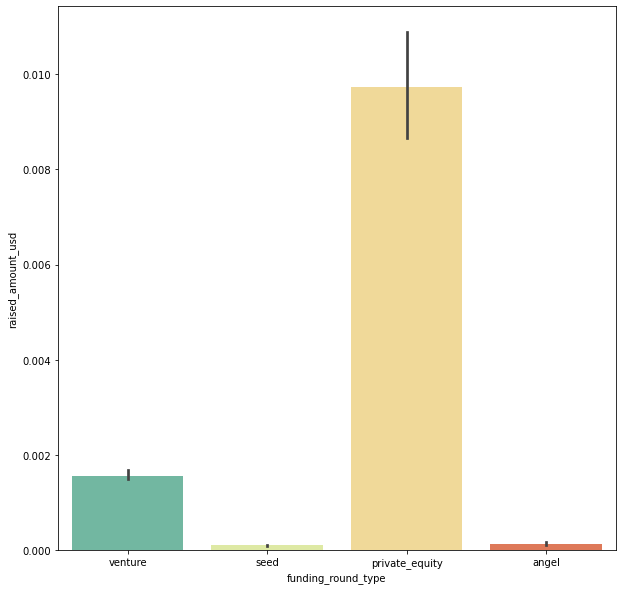

In [68]:
#plotting the percentage of amount invested in each of the 4 interested funding types
plt.figure(figsize = [10,10])
sns.barplot(x = master_frame_FT['funding_round_type'], y = (master_frame_FT['raised_amount_usd']/master_frame_FT['raised_amount_usd'].sum())*100, palette = 'Spectral_r')
plt.show()


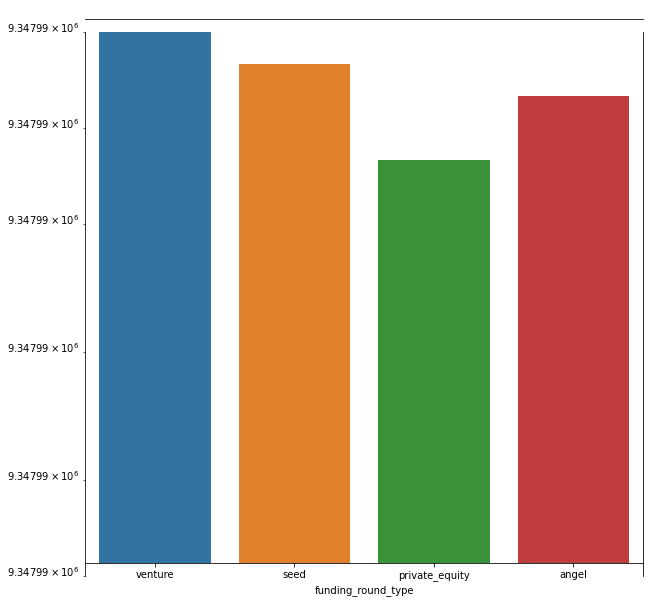

In [289]:
#plotting the average amount of investement in each funding type
plt.figure(figsize = [10,10])
sns.barplot(x = master_frame_FT['funding_round_type'], y = (master_frame_FT['raised_amount_usd'].mean()))
plt.yscale('log')
plt.show()


In [87]:
#Extracting the aggregated data for the top 9 countries
plt.figure(figsize = [10, 10])

#sns.barplot(x = top_9['country_code'], y = top_9['raised_amount_usd'])

top_9_plot = master_frame_ven.groupby('country_code').sum().sort_values(ascending = False, by = 'raised_amount_usd')

top_9_plot = top_9_plot[0:9]
top_9_plot = pd.DataFrame(top_9_plot)

top_9_plot

,raised_amount_usd
country_code,
USA,"422,510,842,796"
CHN,"39,835,418,773"
GBR,"20,245,627,416"
IND,"14,391,858,718"
CAN,"9,583,332,317"
FRA,"7,259,536,732"
ISR,"6,907,514,579"
DEU,"6,346,959,822"
JPN,"3,363,676,611"


<Figure size 720x720 with 0 Axes>

In [85]:
top_9_plot.index

Index(['USA', 'CHN', 'GBR', 'IND', 'CAN', 'FRA', 'ISR', 'DEU', 'JPN'], dtype='object', name='country_code')

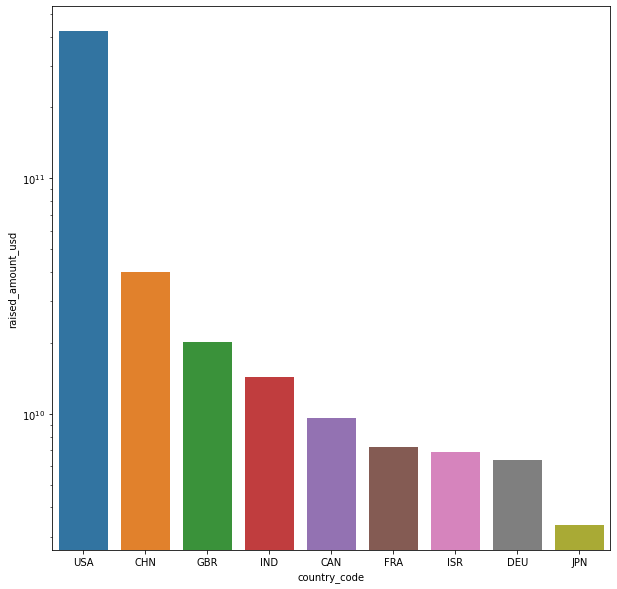

In [86]:
#Plotting the number of investments made in the top 9 countries
plt.figure (figsize = [10,10])

sns.barplot (x = top_9_plot.index, y = top_9_plot['raised_amount_usd'])
plt.yscale('log')
plt.show()

In [112]:
#Creating a new dataframe object with only the top 4 sectors in the top 3 English speaking countries
Top_3 = master_frame_map[(master_frame_map['country_code'].isin(['USA','GBR','IND'])) & (master_frame_map['raised_amount_usd'] >= 5000000) & (master_frame_map['raised_amount_usd'] <= 15000000)]
Top_3 = Top_3.loc[Top_3['main_sector'].isin(['Others', 'Social, Finance, Analytics, Advertising', 'Cleantech / Semiconductors','News, Search and Messaging' ])]

In [120]:
Top_3.head()

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector
71,/organization/1-mainstream,1 Mainstream,http://www.1mainstream.com,Apps|Cable|Distribution|Software,acquired,USA,CA,SF Bay Area,Cupertino,01-03-2012,/organization/1-mainstream,/funding-round/b952cbaf401f310927430c97b68162ea,venture,NaN,17-03-2015,"5,000,000",Apps,"News, Search and Messaging"
78,/organization/acorns-grow,Acorns,http://www.acorns.com,Apps|Finance|FinTech|Mobile|Technology,operating,USA,CA,Anaheim,Newport Beach,29-02-2012,/organization/acorns-grow,/funding-round/fd60be9501849bbdbd89e5d45023e6f5,venture,B,14-03-2014,"6,160,000",Apps,"News, Search and Messaging"
81,/organization/aiotv-inc,aioTV Inc.,http://www.aio-tv.com,Apps|Internet|Media|News|Software|Video|Video Streaming,operating,USA,CO,Denver,Greenwood Village,01-01-2010,/organization/aiotv-inc,/funding-round/853633024c2a3d94ccc4fffd1bc13feb,venture,B,19-11-2012,"8,000,000",Apps,"News, Search and Messaging"
84,/organization/aislebuyer,AisleBuyer,http://www.aislebuyer.com,Apps|iPhone|Mobile|Mobile Commerce|Retail|Startups,acquired,USA,MA,Boston,Boston,01-01-2009,/organization/aislebuyer,/funding-round/fbe190ad6d582c34bdafab9b4ab25d1d,venture,E,13-06-2011,"7,500,000",Apps,"News, Search and Messaging"
94,/organization/appconomy,Appconomy,http://www.appconomy.com,Apps|Mobile|Software,operating,USA,TX,Austin,Austin,01-11-2010,/organization/appconomy,/funding-round/2151522cbc9cdba2c4245448ad87505a,venture,NaN,07-01-2015,"9,000,000",Apps,"News, Search and Messaging"


In [195]:
#deriving a new column to calculate the no. of investments made in each sector in the top 3 English speaking countries
no_of_investments = Top_3.groupby(['main_sector', 'country_code'])['raised_amount_usd'].count()

no_of_investments_psector_pcountry = pd.DataFrame(no_of_investments)

no_of_investments_psector_pcountry

raised_amount_usd
main_sector                             country_code                   
Cleantech / Semiconductors              GBR                         128
                                        IND                          20
                                        USA                        2300
News, Search and Messaging              GBR                          73
                                        IND                          52
                                        USA                        1582
Others                                  GBR                         147
                                        IND                         110
                                        USA                        2950
Social, Finance, Analytics, Advertising GBR                         133
                                        IND                          60
                                        USA                        2714

In [198]:

Top_3 = Top_3.merge(no_of_investments_psector_pcountry, how= 'inner', on = ['main_sector', 'country_code'])

In [202]:
Top_3.tail(200)

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd_x,primary_sector,main_sector,raised_amount_usd_y
10069,/organization/arkex,ARKeX,http://www.arkex.com,Consulting,operating,GBR,C3,London,Cambridge,01-01-2004,/organization/arkex,/funding-round/1b897718ae767b333317c5b3171049c4,venture,B,14-12-2005,"8,860,386",Consulting,"Social, Finance, Analytics, Advertising",133
10070,/organization/aveillant,Aveillant,http://www.aveillant.com,Consulting,operating,GBR,C3,London,Cambridge,01-10-2011,/organization/aveillant,/funding-round/fc8e349074d36ca828d552ca8926f50d,venture,B,20-02-2013,"10,334,077",Consulting,"Social, Finance, Analytics, Advertising",133
10071,/organization/spex-group,Spex Group,http://spex-innovation.com,Consulting,operating,GBR,T5,Aberdeen,Aberdeen,01-01-2009,/organization/spex-group,/funding-round/54c76212f8233bcde0eacb320437b751,venture,NaN,04-03-2014,"7,576,257",Consulting,"Social, Finance, Analytics, Advertising",133
10072,/organization/peoplevox,Peoplevox,http://www.peoplevox.co.uk,Databases|Enterprise Software|Software,operating,GBR,F8,Watford,Watford,01-08-2008,/organization/peoplevox,/funding-round/169b0c14658bb5b2e38e00742111a6d1,venture,A,25-02-2015,"6,000,000",Databases,"Social, Finance, Analytics, Advertising",133
10073,/organization/mythings,myThings,http://www.mythings.com,Accounting|Advertising|Performance Marketing,operating,GBR,H9,London,London,01-01-2005,/organization/mythings,/funding-round/33b07317347464878c1fd06c79a18e8c,venture,D,20-03-2012,"15,000,000",Accounting,"Social, Finance, Analytics, Advertising",133
10074,/organization/mythings,myThings,http://www.mythings.com,Accounting|Advertising|Performance Marketing,operating,GBR,H9,London,London,01-01-2005,/organization/mythings,/funding-round/4327f9e58ad74196c2d1da8515fbd078,venture,A,01-04-2006,"8,000,000",Accounting,"Social, Finance, Analytics, Advertising",133
10075,/organization/mythings,myThings,http://www.mythings.com,Accounting|Advertising|Performance Marketing,operating,GBR,H9,London,London,01-01-2005,/organization/mythings,/funding-round/9b39194e9de805e27fd6b083550b31eb,venture,C,23-11-2010,"6,000,000",Accounting,"Social, Finance, Analytics, Advertising",133
10076,/organization/mythings,myThings,http://www.mythings.com,Accounting|Advertising|Performance Marketing,operating,GBR,H9,London,London,01-01-2005,/organization/mythings,/funding-round/e317d052c93ee95c7c7c64530536e9eb,venture,B,14-10-2008,"5,000,000",Accounting,"Social, Finance, Analytics, Advertising",133
10077,/organization/vouchedfor,VouchedFor,https://www.vouchedfor.co.uk,Accounting|Finance|Legal|Marketplaces,closed,GBR,L1,Twickenham,Twickenham,01-01-2012,/organization/vouchedfor,/funding-round/a6666153adfbfd2e4a9e0f95ccab353d,venture,A,05-10-2015,"5,400,000",Accounting,"Social, Finance, Analytics, Advertising",133
10078,/organization/kantox,Kantox,http://www.kantox.com,B2B|Enterprise Software|Finance Technology|Financial Services|FinTech|Small and Medium Businesses,operating,GBR,H9,London,London,03-06-2011,/organization/kantox,/funding-round/41c2cc62723b6a8fdb0fc4dcc63c476d,venture,A,10-02-2014,"8,724,972",B2B,"Social, Finance, Analytics, Advertising",133


In [203]:
#renaming the newly merged column to make it easier to read
Top_3.rename(columns = {'raised_amount_usd_y':'no_of_investments_per_sector_per_country', 'raised_amount_usd_x': 'raised_amount_usd'}, inplace = True)

In [204]:
#performing sanity checks 
Top_3.tail(25)

,permalink,name,homepage_url,category_list,status,country_code,state_code,region,city,founded_at,company_permalink,funding_round_permalink,funding_round_type,funding_round_code,funded_at,raised_amount_usd,primary_sector,main_sector,no_of_investments_per_sector_per_country
10244,/organization/tssi-systems,TSSI Systems,http://www.tssi.co.uk,Security,operating,GBR,P8,Swindon,Swindon,NaN,/organization/tssi-systems,/funding-round/5a5067667deed1fd4b0f368147ba54a7,venture,NaN,26-07-2005,"6,084,330",Security,Others,147
10245,/organization/usentric,Usentric,NaN,Security,operating,GBR,H7,Sutton Saint James,Sutton Saint James,NaN,/organization/usentric,/funding-round/48a029aaf9ddf7fa1fdd7b73f23a91b0,venture,NaN,11-04-2006,"6,110,000",Security,Others,147
10246,/organization/cambridge-broadband-networks,Cambridge Broadband Networks,http://www.cbnl.com,Telecommunications|Web Hosting,operating,GBR,C3,London,Cambridge,01-01-2000,/organization/cambridge-broadband-networks,/funding-round/074110c11eded6f4c95069aa7eb8e70a,venture,NaN,05-02-2009,"7,500,000",Telecommunications,Others,147
10247,/organization/cambridge-broadband-networks,Cambridge Broadband Networks,http://www.cbnl.com,Telecommunications|Web Hosting,operating,GBR,C3,London,Cambridge,01-01-2000,/organization/cambridge-broadband-networks,/funding-round/bccefa9f77b9fa66cdb906326dcf638c,venture,D,16-01-2006,"9,000,000",Telecommunications,Others,147
10248,/organization/silverrail-technologies,SilverRail Technologies,http://silverrailtech.com,Technology|Transportation|Travel,operating,GBR,H9,London,London,01-04-2009,/organization/silverrail-technologies,/funding-round/0a2b6e0f972e70b2341f5881a9af7d72,venture,NaN,15-04-2011,"5,000,000",Technology,Others,147
10249,/organization/silverrail-technologies,SilverRail Technologies,http://silverrailtech.com,Technology|Transportation|Travel,operating,GBR,H9,London,London,01-04-2009,/organization/silverrail-technologies,/funding-round/62591190189bc8e378ef8a01939c7eae,venture,A,21-07-2010,"9,000,000",Technology,Others,147
10250,/organization/silverrail-technologies,SilverRail Technologies,http://silverrailtech.com,Technology|Transportation|Travel,operating,GBR,H9,London,London,01-04-2009,/organization/silverrail-technologies,/funding-round/6816b97b970b7b95395f903ce1dd6d0d,venture,B,21-03-2012,"15,000,000",Technology,Others,147
10251,/organization/prodigy-finance,Prodigy Finance,http://prodigyfinance.com,Alumni|Crowdfunding|Education|Emerging Markets|Enterprises|Finance,operating,GBR,H9,London,London,22-08-2007,/organization/prodigy-finance,/funding-round/276e8e303766a0519fa5e4b7844978d0,venture,NaN,10-08-2015,"12,500,000",Alumni,Others,147
10252,/organization/alfresco,Alfresco,http://www.alfresco.com,Document Management|Enterprises|Enterprise Software,operating,GBR,P9,London,Maidenhead,01-01-2005,/organization/alfresco,/funding-round/0db504d02c87c2b963283fd3c6d17594,venture,C,22-01-2008,"13,000,000",Document Management,Others,147
10253,/organization/alfresco,Alfresco,http://www.alfresco.com,Document Management|Enterprises|Enterprise Software,operating,GBR,P9,London,Maidenhead,01-01-2005,/organization/alfresco,/funding-round/31e53d286c451b905ffaade895f4a83e,venture,B,08-02-2006,"8,000,000",Document Management,Others,147


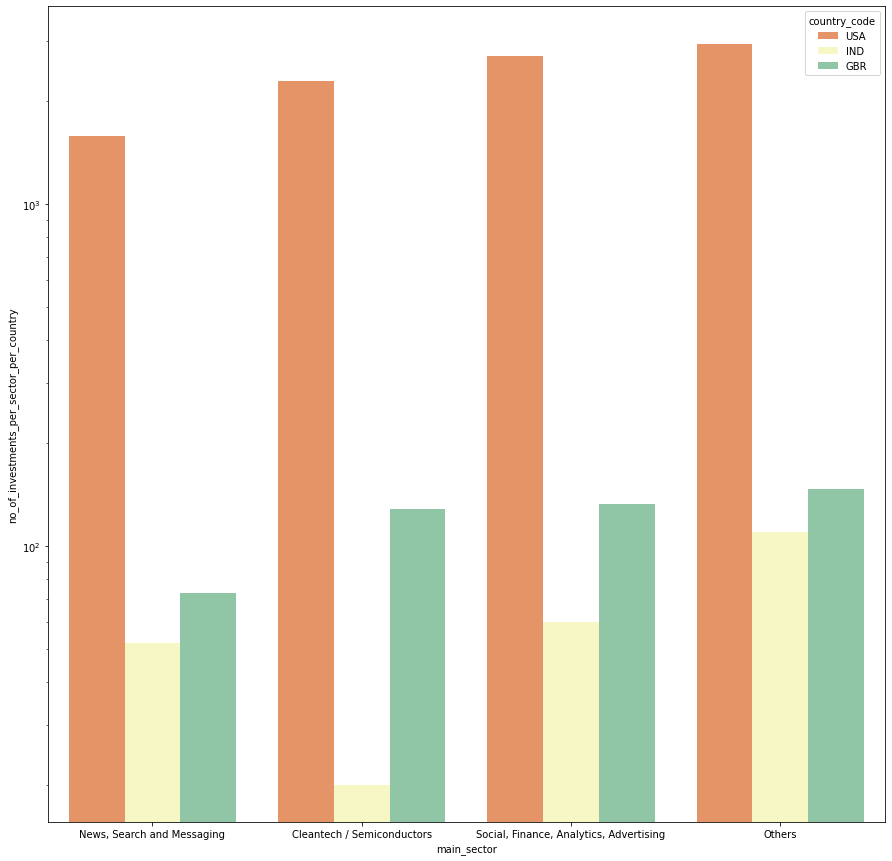

In [214]:
#plotting the no of investments in the top 4 sectors in each of the top 3 English speaking countries
plt.figure(figsize = [15,15])                  
sns.barplot(x = 'main_sector', y = 'no_of_investments_per_sector_per_country', hue = 'country_code' , data = Top_3, palette = 'Spectral')
plt.yscale('log')
plt.show()

Since Spark funds is looking to invest in the most widely invested country and in one of the most widely invested sectors, it should place its money in the United States.
The reasons for choosing United States over the other 2 countries are
     Number of investments raised by USA is almost 20 times as much as Great Britain and 36 times as much as India
     Ease of communication since English is the de facto language in USA whereas it is only the official language in India, among many other languages. 
     
Spark Funds could invest its money in either Others or Social, Finance, Analytics, Advertising sectors since the number of investments raised by both the sectors in the United States in relatively similar. 
